# **Employee Attrition Rate Analysis**

 The project aims to create a data visualization dashboard consisting of basic, interactive and animated plots using python-based libraries. This is a notebook which documents all the visualization created as a part of this project.

# Libraries & Packages

Installing the necessary libraries not present in the Google Collab for plotting.

In [ ]:
!pip install plotly
!pip install streamlit
!pip install mne_connectivity
!pip install mycolorpy

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 9.2 MB 3.2 MB/s 
     |████████████████████████████████| 164 kB 60.4 MB/s 
     |████████████████████████████████| 182 kB 26.4 MB/s 
     |████████████████████████████████| 4.7 MB 9.9 MB/s 
     |████████████████████████████████| 78 kB 3.2 MB/s 
     |████████████████████████████████| 237 kB 60.3 MB/s 
     |████████████████████████████████| 62 kB 252 kB/s 
     |████████████████████████████████| 51 kB 2.0 MB/s 
  Created wheel for validators: filename=validators-0.20.0-py3-none-any.whl size=19581 sha256=6fb9234f0a596ac9431b7facdd3b8967941a97457f8479e300abb69648c39cf9
  Stored in directory: /root/.cache/pip/wheels/19/09/72/3eb74d236bb48bd0f3c6c3c83e4e0c5bbfcbcad7c6c3539db8
Successfully built validators
Looking in indexes: https://pypi.org/simple, https

Importing necessary libraries used further in the code.

In [ ]:
# Helper libraries
import pandas as pd
import numpy as np
import scipy.stats as st
import base64
from io import BytesIO
import IPython
from bs4 import BeautifulSoup
from google.colab import drive

# Visualization libraries
import matplotlib.pyplot as plt
import seaborn as sns
import altair as alt
import plotly.graph_objects as go
import plotly.io as pio
import plotly.express as px
import plotly.offline as pyo
from mne_connectivity.viz import plot_connectivity_circle
from mycolorpy import colorlist as mcp

In [ ]:
drive.mount('/content/gdrive/', force_remount=True)
%cd gdrive/MyDrive/

Mounted at /content/gdrive/
/content/gdrive/MyDrive


# HR Analytics Data

The IBM HR Analytics data consists of employee data and their feedback about the company. There are variables in this data which take into account reasons behind an employee's exit from the organization. It also has the data of the employees who stay back in the company.

Creating a dataframe for the Kaggle's IBM HR Analytics Employee Attrition & Performance dataset.


https://www.kaggle.com/datasets/pavansubhasht/ibm-hr-analytics-attrition-dataset

In [ ]:
attrition_df = pd.read_csv("/content/gdrive/MyDrive/kaggle.csv")
attrition_df.head()

,Age,Attrition,BusinessTravel,DailyRate,Department,DistanceFromHome,Education,EducationField,EmployeeCount,EmployeeNumber,...,RelationshipSatisfaction,StandardHours,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager
0,41,Yes,Travel_Rarely,1102,Sales,1,2,Life Sciences,1,1,...,1,80,0,8,0,1,6,4,0,5
1,49,No,Travel_Frequently,279,Research & Development,8,1,Life Sciences,1,2,...,4,80,1,10,3,3,10,7,1,7
2,37,Yes,Travel_Rarely,1373,Research & Development,2,2,Other,1,4,...,2,80,0,7,3,3,0,0,0,0
3,33,No,Travel_Frequently,1392,Research & Development,3,4,Life Sciences,1,5,...,3,80,0,8,3,3,8,7,3,0
4,27,No,Travel_Rarely,591,Research & Development,2,1,Medical,1,7,...,4,80,1,6,3,3,2,2,2,2


# Preprocessing

Checking for missing values in the data.

In [ ]:
attrition_df.isna().values.any()

False

Checking certain columns for unique values.

In [ ]:
attrition_df['EmployeeCount'].unique()

array([1])

In [ ]:
len(attrition_df['EmployeeNumber'].unique()) == len(attrition_df)

True

In [ ]:
attrition_df['Over18'].unique()

array(['Y'], dtype=object)

In [ ]:
attrition_df['StandardHours'].unique()

array([80])

All of the columns examined above contain single value for all the observations. Hence, dropping these columns which are not much useful for creating visualizations.

In [ ]:
attrition_df.drop(columns = ['EmployeeCount','EmployeeNumber','Over18','StandardHours'], inplace = True)

## Use of Seaborn for Analysis of Features

Visualizing the relationship between each variable.

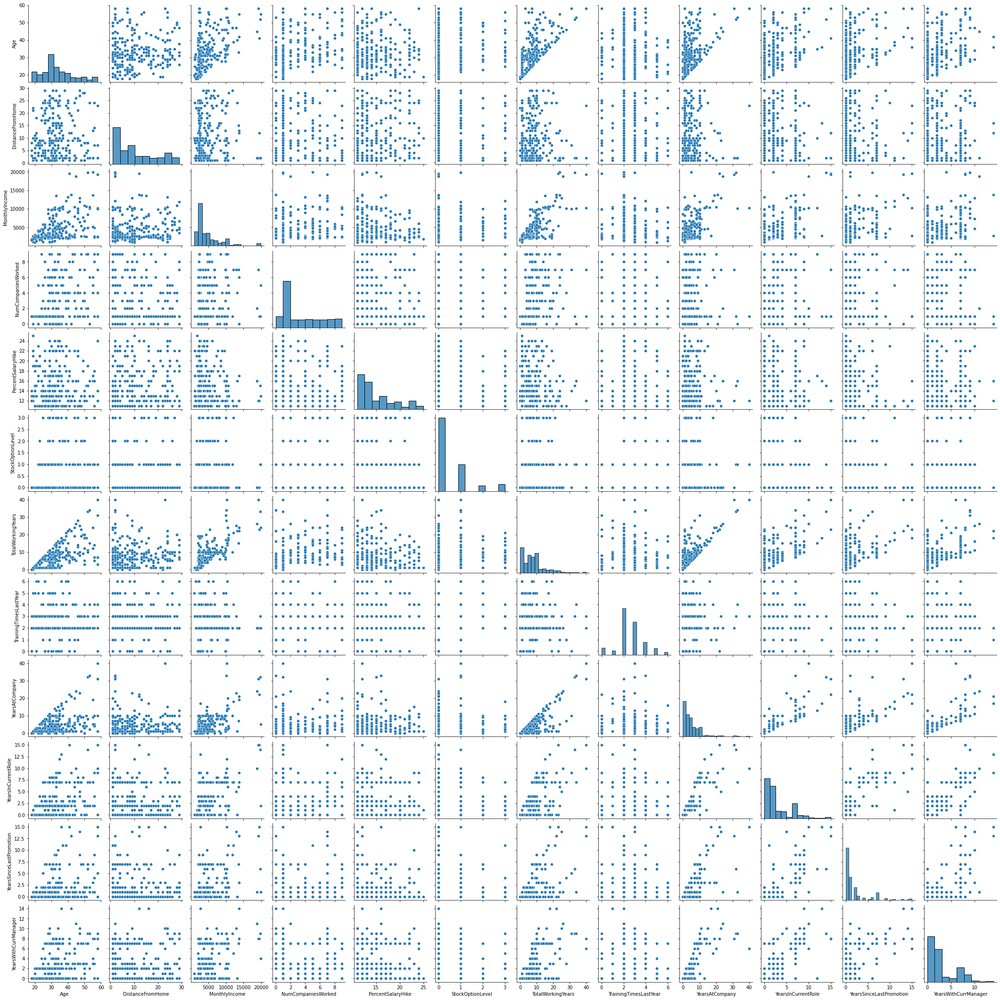

In [ ]:
df_for_pairplot = attrition_df.drop(columns = ['BusinessTravel','DailyRate','Department','Education','EducationField','EnvironmentSatisfaction','Gender','HourlyRate','JobInvolvement','JobLevel','JobSatisfaction','MaritalStatus','MonthlyRate','OverTime','PerformanceRating','RelationshipSatisfaction','WorkLifeBalance'])
sns.pairplot(df_for_pairplot[df_for_pairplot.Attrition == "Yes"])

This dataset contains lots of columns with large amount of data. It can be clearly seen that some of the variable have numeric value but are categorical in nature. 

Creating a correlation heatmap to visualize the correlation between different features.

Reference for this plot is taken from: https://medium.com/@szabo.bibor/how-to-create-a-seaborn-correlation-heatmap-in-python-834c0686b88e

<ipython-input-12-04f6649d2012>:2: DeprecationWarning:

`np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations



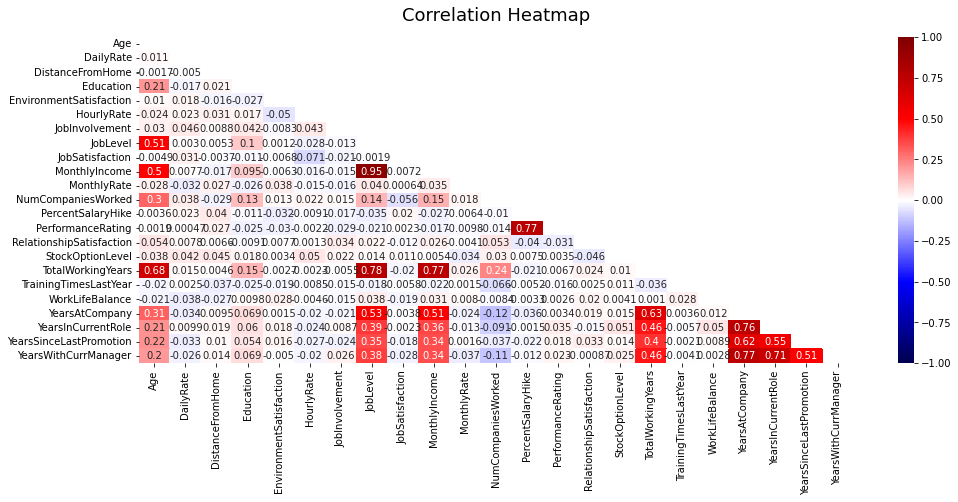

In [ ]:
plt.figure(figsize=(16, 6))
mask = np.triu(np.ones_like(attrition_df.corr(), dtype=np.bool))
heatmap = sns.heatmap(attrition_df.corr(), mask=mask, vmin=-1, vmax=1, annot=True, cmap='seismic')
heatmap.set_title('Correlation Heatmap', fontdict={'fontsize':18}, pad=16);

There are very few features with high correlation between them such as Age, Job Level, Education, Monthly Income, Number of Companies Worked, Percent Salary Hike, Performance Rating, Total Working Years, Years at Company, Years in Current Role, Years Since Last Promotion, etc. Hence, these variables will be majorly used to create visualizations.

Creating dataframes based on attrition value that will be further in this project.

In [ ]:
attrition_yes_df = attrition_df[attrition_df.Attrition == "Yes"]
attrition_no_df = attrition_df[attrition_df.Attrition == "No"]

# Uniform color map to be used throughout the project
tab10_colors = mcp.gen_color(cmap="tab10",n=10)

# Static Visualizations

## Violin Plot

Defining the data to be used for Violin Plot.

The data to be plotted on the Y-axis belongs to 'YearsAtCompany;' variable. Whereas, on the X-axis different categories of education level will be plotted.

Reference used for Violin Plot: https://www.python-graph-gallery.com/web-ggbetweenstats-with-matplotlib

In [ ]:
education_values = sorted(attrition_yes_df['Education'].unique())
y_data = [attrition_yes_df[attrition_yes_df['Education'] == edu]['YearsAtCompany'].values for edu in education_values]
total_data = [attrition_df[attrition_df['Education'] == edu]['YearsAtCompany'].values for edu in education_values]

Creating boxplots for different education levels ranging across the x_positions and encoded by different colors.

/usr/local/lib/python3.8/dist-packages/matplotlib/cbook/__init__.py:1376: VisibleDeprecationWarning:

Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.



{'whiskers': [<matplotlib.lines.Line2D at 0x7f60845e1a30>,
 'caps': [],
 'boxes': [<matplotlib.lines.Line2D at 0x7f60845e16d0>,
 'medians': [<matplotlib.lines.Line2D at 0x7f608458c130>,
 'fliers': [],
 'means': []}

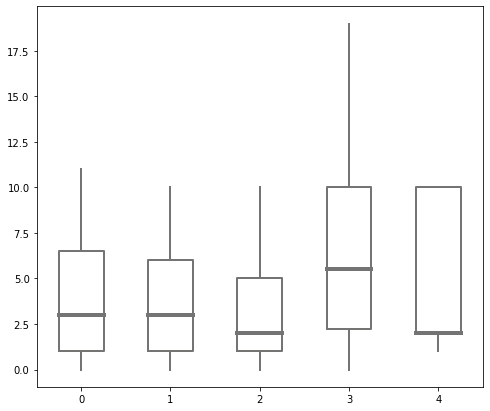

In [ ]:
x_positions = [0, 1, 2, 3, 4]

fig, ax = plt.subplots(figsize= (8, 7))

medianprops = dict(
    linewidth=4, 
    color="#747473"
)
boxprops = dict(
    linewidth=2, 
    color="#747473"
)

ax.boxplot(
    y_data,
    positions=x_positions, 
    showfliers = False, # Do not show the outliers beyond the caps.
    showcaps = False,   # Do not show the caps
    medianprops = medianprops,
    whiskerprops = boxprops,
    boxprops = boxprops
)

To further get an idea about the probability distribution of the data along the Y-axis, Violins need to be added for each category.

/usr/local/lib/python3.8/dist-packages/matplotlib/cbook/__init__.py:1376: VisibleDeprecationWarning:

Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.

/usr/local/lib/python3.8/dist-packages/numpy/core/fromnumeric.py:1970: VisibleDeprecationWarning:

Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.



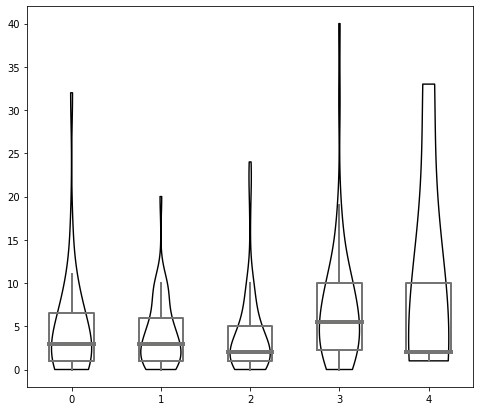

In [ ]:
# The output is stored in 'violins', used to customize their appearence
violins = ax.violinplot(
    y_data, 
    positions=x_positions,
    widths=0.45,
    bw_method="silverman", # bw_method="silverman" means the bandwidth of the kernel density
    showmeans=False, 
    showmedians=False,
    showextrema=False
)

# Customize violins (remove fill, customize line, etc.)
for pc in violins['bodies']:
    pc.set_facecolor("none")
    pc.set_edgecolor("black")
    pc.set_linewidth(1.4)
    pc.set_alpha(1)

fig

 However, this plot doesn’t give an idea about the number of data points in each category. To solve this issue, scatter points should plotted belonging to each category with a different color. 

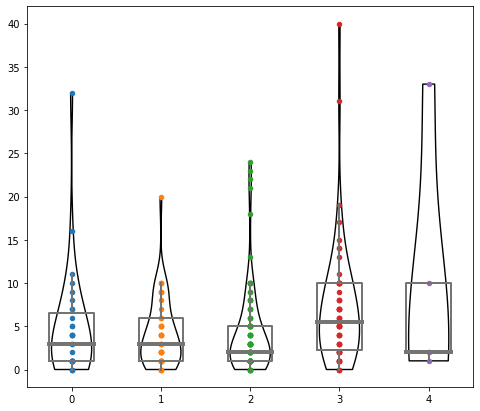

In [ ]:
color_values = tab10_colors[0:5]
x_data = [np.array([i] * len(d)) for i, d in enumerate(y_data)]

for x, y, color in zip(x_data, y_data, color_values):
    ax.scatter(x, y, s = 20, color=color)
    
fig

Since there is a single axis for each category, it leads to overlapping points. The scatter points are jittered along with adjusting transparency to represent the number of points in different categories.

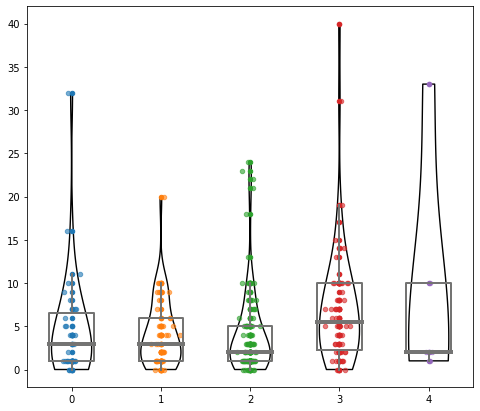

In [ ]:
# Create jittered version of "x"
jitter = 0.04
x_data = [np.array([i] * len(d)) for i, d in enumerate(y_data)]
x_jittered = [x + st.t(df=6, scale=jitter).rvs(len(x)) for x in x_data]

# Add jittered dots
for x, y, color in zip(x_jittered, y_data, color_values):
    ax.scatter(x, y, s = 20, color=color, alpha=0.6)

fig

However, the category labels are numbers which could be difficult to interpret. A final figure can be generated by converting these values to respective labels and naming the axes.

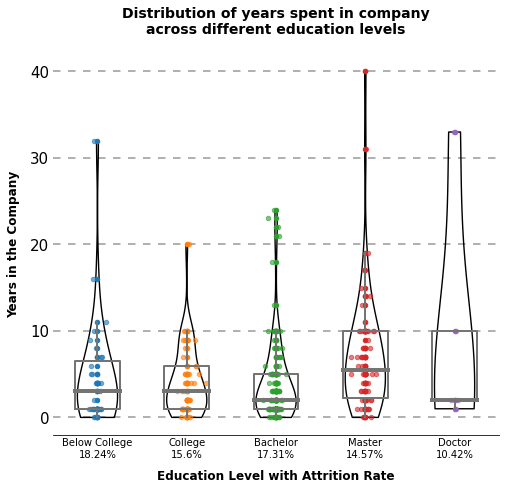

In [ ]:
# Horizontal lines that are used as scale reference
horizontal_lines = [0, 10, 20, 30, 40]
for h in horizontal_lines:
    ax.axhline(h, color="#7F7F7F", ls=(0, (5, 5)), alpha=0.8, zorder=0)

# Customize labels and ticks
ax.tick_params(length=0)
ax.set_yticks(horizontal_lines)
ax.set_yticklabels(horizontal_lines, size=15)
ax.set_ylabel("Years in the Company", fontweight="bold", size=12, labelpad=10)

education_str = ["Below College", "College", "Bachelor", "Master", "Doctor"]
xlabels = []
for i in range(0,len(education_values)):
  xlabels.append(education_str[i] + "\n" + str(round((y_data[i].size * 100 ) / total_data[i].size, 2)) + "%")
ax.set_xticks(x_positions)
ax.set_xticklabels(xlabels, ha="center", ma="center")
ax.set_xlabel("Education Level with Attrition Rate", fontweight="bold", size=12, labelpad=10)

ax.set_title("Distribution of years spent in company\nacross different education levels", fontweight="bold", size=14, pad=20)

for pos in ['right', 'top', 'left']:
   ax.spines[pos].set_visible(False)

fig

The final plot thus created depicts distribution of the employees quitting the company after certain number of years belonging to different categories of education level. 

Saving the figure as encoded image to be used later for creating the HTML dashboard.

In [ ]:
fig.savefig('violinPlot.png', format='png')
tmpfile = BytesIO()
fig.savefig(tmpfile, format='png')
violinPlot_encoded = base64.b64encode(tmpfile.getvalue()).decode('utf-8')

## Parallel Plot

A parallel plot plot allows to compare the feature of several individual observations (series) on a set of numeric variables. To compare the numerical rating values of pyschological factors such as job satisfaction, work life balance, relationship satisfaction, etc a parallel plot is created below.

In [ ]:
psychological_data = {'JobLevel': attrition_yes_df['JobLevel'],
                      'JobInvolvement': attrition_yes_df['JobInvolvement'],
                      'JobSatisfaction': attrition_yes_df['JobSatisfaction'],  
                      'WorkLifeBalance': attrition_yes_df['WorkLifeBalance'],
                      'RelationshipSatisfaction': attrition_yes_df['RelationshipSatisfaction'],
                      'EnvironmentSatisfaction': attrition_yes_df['EnvironmentSatisfaction']
     }
psychological_df = pd.DataFrame(data=psychological_data)

# Create the chart by selecting features which have values of same scale
fig = px.parallel_coordinates(
    psychological_df, 
    color="JobLevel", 
    labels={"JobLevel": "JobLevel","JobInvolvement": "JobInvolvement", "JobSatisfaction": "JobSatisfaction", "PerformanceRating": "PerformanceRating", "WorkLifeBalance": "WorkLifeBalance", "RelationshipSatisfaction": "RelationshipSatisfaction", "EnvironmentSatisfaction": "EnvironmentSatisfaction", "JobLevel": "JobLevel"},
    color_continuous_midpoint=2)

fig.update_layout(coloraxis_showscale=True)

fig.show()

The above plot is created using Plotly and might not render when viewed as notebook or in the HTML format.

Looking at this figure, it is difficult to get the insights. Even if the color scheme and ordering of variables is changed the figure would still remain jumbled. The reason behind failure of Parallel Plot in this scenario is because the numerical variables represented above are not continuous in nature. These values are the encodings for categorical variables.

## Chord Diagram

Chord diagrams can be created using Matplotlib, Seaborn, Plotly, Bokeh and MNE. Although MNE library has been written for neuroscience purposes, it comes with some handy functions when it comes to building chord diagrams.


Reference used for Chord Diagram: https://mne.tools/mne-connectivity/dev/auto_examples/mixed_source_space_connectivity.html#sphx-glr-auto-examples-mixed-source-space-connectivity-py

Selecting columns and creating a list of nodes having the column values to be represented on circle.

In [ ]:
columns = ["JobInvolvement", "JobSatisfaction", "WorkLifeBalance", "RelationshipSatisfaction", "EnvironmentSatisfaction"]
node_names= []

for c in columns:
  unique_values = sorted(psychological_df[c].unique())
  for val in unique_values:
    node_names.append(c + " " + str(val))

print(node_names)

['JobInvolvement 1', 'JobInvolvement 2', 'JobInvolvement 3', 'JobInvolvement 4', 'JobSatisfaction 1', 'JobSatisfaction 2', 'JobSatisfaction 3', 'JobSatisfaction 4', 'WorkLifeBalance 1', 'WorkLifeBalance 2', 'WorkLifeBalance 3', 'WorkLifeBalance 4', 'RelationshipSatisfaction 1', 'RelationshipSatisfaction 2', 'RelationshipSatisfaction 3', 'RelationshipSatisfaction 4', 'EnvironmentSatisfaction 1', 'EnvironmentSatisfaction 2', 'EnvironmentSatisfaction 3', 'EnvironmentSatisfaction 4']


Creating a 2d matrix for storing weights of links between each node. These weights are the count of employees belonging to those categories of nodes.

In [ ]:
# Initialising 2d array with weight values as 0 
node_values = np.zeros((len(node_names),len(node_names)))

for i in range (0, len(node_names)):
  for j in range (0, len(node_names)):
    c1 = node_names[i].split(' ')[0] # column 1
    c2 = node_names[j].split(' ')[0] # column 2
    val1 = node_names[i].split(' ')[1] # category of column 1
    val2 = node_names[j].split(' ')[1] # category of column 2
    if(c1 != c2): # Storing values only for categories belonging to different columns
      node_values[i][j] = len(psychological_df[(psychological_df[c1] == int(val1)) & (psychological_df[c2] == int(val2))])

node_values

array([[ 0.,  0.,  0.,  0.,  5.,  5.,  9.,  9.,  3.,  9., 15.,  1.,  4.,
         7.,  7., 10., 12.,  8.,  4.,  4.],
       [ 0.,  0.,  0.,  0., 24., 15., 18., 14.,  7., 16., 38., 10., 18.,
        17., 23., 13., 19.,  9., 27., 16.],
       [ 0.,  0.,  0.,  0., 33., 23., 41., 28., 15., 30., 64., 16., 33.,
        20., 37., 35., 38., 24., 25., 38.],
       [ 0.,  0.,  0.,  0.,  4.,  3.,  5.,  1.,  0.,  3., 10.,  0.,  2.,
         1.,  4.,  6.,  3.,  2.,  6.,  2.],
       [ 5., 24., 33.,  4.,  0.,  0.,  0.,  0.,  8., 13., 39.,  6., 16.,
        15., 22., 13., 20., 14., 16., 16.],
       [ 5., 15., 23.,  3.,  0.,  0.,  0.,  0.,  4.,  8., 26.,  8., 15.,
         8., 13., 10., 16.,  8., 12., 10.],
       [ 9., 18., 41.,  5.,  0.,  0.,  0.,  0.,  8., 18., 43.,  4., 16.,
        11., 19., 27., 22., 13., 16., 22.],
       [ 9., 14., 28.,  1.,  0.,  0.,  0.,  0.,  5., 19., 19.,  9., 10.,
        11., 17., 14., 14.,  8., 18., 12.],
       [ 3.,  7., 15.,  0.,  8.,  4.,  8.,  5.,  0.,  0.,  0.,  

Storing node names for each category of a column.

In [ ]:
updated_node_names = []
for name in node_names:
  updated_node_names.append(name.split(' ')[1])

Plotting the connectivity circle with labels

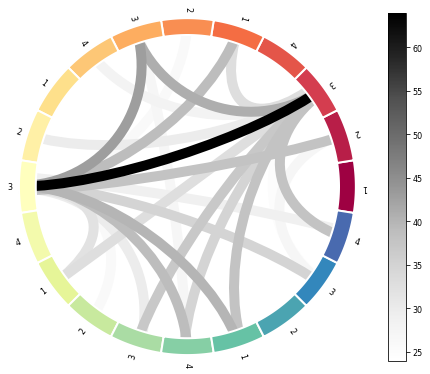

(<Figure size 576x576 with 2 Axes>,
 <matplotlib.axes._subplots.PolarAxesSubplot at 0x7f608456edf0>)

In [ ]:
fig, ax = plt.subplots(figsize=(8, 8), subplot_kw=dict(polar=True))
plot_connectivity_circle(
    node_values, 
    updated_node_names,
    colormap='Greys', 
    facecolor='white', 
    textcolor='black', 
    colorbar=True,
    interactive=True,
    n_lines=25, # Show only 25 links with highest values
    linewidth=10,
    colorbar_size=0.8,
    padding=0.6,
    node_edgecolor="white",
    ax=ax)

The connectivity circle justifies it purpose of representing the frequency between each node. However, the color scale for the nodes is not appropriate to segregate into variables that were defined. This can be solved by changing colormap. Tab20 is the best suited for this data, since there are 20 nodes and each column has 4 nodes. Also , the variables need to be labeled.

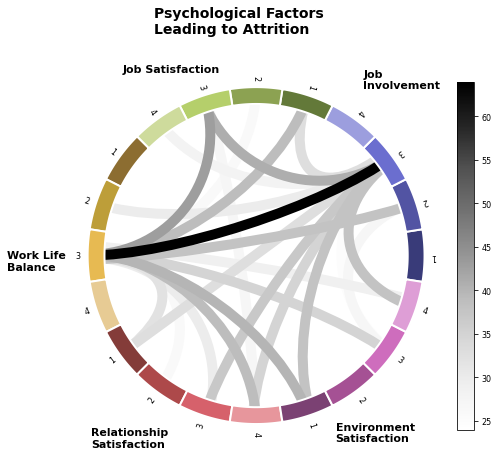

(<Figure size 576x576 with 2 Axes>,
 <matplotlib.axes._subplots.PolarAxesSubplot at 0x7f6083aa7670>)

In [ ]:
node_color_values = mcp.gen_color(cmap="tab20b",n=20)

fig, ax = plt.subplots(figsize=(8, 8), subplot_kw=dict(polar=True))
ax.text(2, 14.5, "Psychological Factors\nLeading to Attrition", fontweight="bold", size=14)
ax.text(1, 11.8, "Job\nInvolvement", fontweight="bold", size=11)
ax.text(3.2, 14.8, "Work Life\nBalance", fontweight="bold", size=11)
ax.text(2.2, 13.5, "Job Satisfaction", fontweight="bold", size=11)
ax.text(11.4, 12, "Environment\nSatisfaction", fontweight="bold", size=11)
ax.text(4, 15, "Relationship \nSatisfaction", fontweight="bold", size=11)
plot_connectivity_circle(
    node_values, 
    updated_node_names,
    node_colors = node_color_values,
    colormap='Greys', 
    facecolor='white', 
    textcolor='black', 
    colorbar=True,
    interactive=True,
    n_lines=25,
    linewidth=10,
    colorbar_size=0.8,
    padding=0.6,
    node_edgecolor="white",
    ax=ax)

The node groups belonging to a column can further be segregated by adding a separation between each column. This can be done by assigning angles to each node.

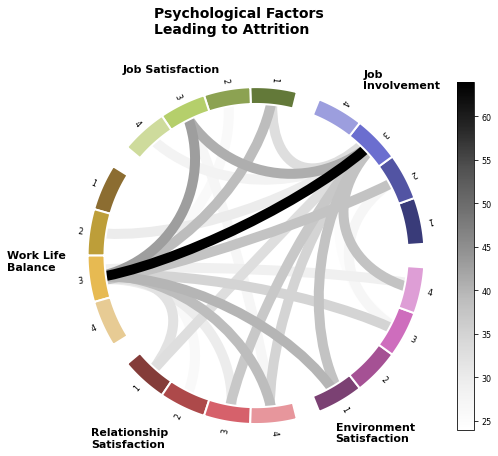

(<Figure size 576x576 with 2 Axes>,
 <matplotlib.axes._subplots.PolarAxesSubplot at 0x7f60839d3430>)

In [ ]:
# Assigning angles for each node
start, end = 12, 60
angles_set = []
angles_set.append((np.linspace(start, end, len(node_names)//5)).astype(int)[::+1] %360)
for i in range(0,4):
  angles_set.append(angles_set[i] + 72)

node_angle_values = np.concatenate(angles_set)

fig, ax = plt.subplots(figsize=(8, 8), subplot_kw=dict(polar=True))
ax.text(2, 14.5, "Psychological Factors\nLeading to Attrition", fontweight="bold", size=14)
ax.text(1, 11.8, "Job\nInvolvement", fontweight="bold", size=11)
ax.text(3.2, 14.8, "Work Life\nBalance", fontweight="bold", size=11)
ax.text(2.2, 13.5, "Job Satisfaction", fontweight="bold", size=11)
ax.text(11.4, 12, "Environment\nSatisfaction", fontweight="bold", size=11)
ax.text(4, 15, "Relationship \nSatisfaction", fontweight="bold", size=11)
plot_connectivity_circle(
    node_values, 
    updated_node_names,
    node_colors = node_color_values,
    node_angles = node_angle_values,
    colormap='Greys', 
    facecolor='white', 
    textcolor='black', 
    colorbar=True,
    interactive=True,
    n_lines=25,
    linewidth=10,
    colorbar_size=0.8,
    padding=0.6,
    node_edgecolor="white",
    ax=ax)


Hence, by using Sequential and Qualitative colormaps different categories and the frequency between each node is represented in the above Chord Diagram.

Saving the figure as encoded image to be used later for creating the HTML dashboard.

In [ ]:
fig.savefig('chordDiagram.png', format='png')
tmpfile = BytesIO()
fig.savefig(tmpfile, format='png')
chordDiagram_encoded = base64.b64encode(tmpfile.getvalue()).decode('utf-8')

# Interactive Visualizations

## Histogram

A Histogram represents the distribution of a numeric variable for one or several groups. The values are split in bins, each bin is represented as a bar.
Histogram can be used to view various features present in this dataset. Two such features selected for visualizing in this plot are the numerical variable of Distance from Home and the categorical variable of Business Travel

Reference used for creating Histogram: https://altair-viz.github.io/gallery/stacked_bar_chart.html

Selecting the categories to be plotted in histogram along with colors.

In [ ]:
businessTravel_categories = attrition_yes_df['BusinessTravel'].unique()
bar_colors = tab10_colors[1:4]

Assigning separate color for each category of Business Travel.

In [ ]:
selection = alt.selection_single(fields = ['BusinessTravel'])

color = alt.condition(selection,
                      alt.Color('BusinessTravel:N', 
                                scale=alt.Scale(
                                  domain = businessTravel_categories,
                                  range = bar_colors)),
                      alt.value('lightgray'))

Plotting the Histogram with bar of each category stacked above other.

In [ ]:
alt.Chart(attrition_yes_df).mark_bar().encode(
    alt.X('DistanceFromHome:Q', bin=True, axis=alt.Axis(title='Distance From Home')),
    alt.Y('count()', stack=True, axis=alt.Axis(title='No. of Employees')), # Stacking categories om top of each other
    color = color
).properties(
    width=300,
    height=300,
    title="Attrition rate due to Business Travel & Distance"
).configure_axis(
    grid=False,
    labelFontSize=12,
    labelPadding=5,
    titleFontSize=14,
    titlePadding=10
).configure_title(
    anchor="middle",
    fontSize=18
).add_selection(
    selection
)

alt.Chart(...)

Although stacking of bars allows comparison of different categories, it does not give an appropriate perspective for comparing the frequencies in different bins.

In [ ]:
alt.Chart(attrition_yes_df).mark_bar().encode(
    alt.X('DistanceFromHome:Q', bin=True, axis=alt.Axis(title='Distance From Home')),
    alt.Y('count()', stack=None, axis=alt.Axis(title='No. of Employees')), # Stacking categories om top of each other
    color = color
).properties(
    width=300,
    height=300,
    title="Attrition rate due to Business Travel & Distance"
).configure_axis(
    grid=False,
    labelFontSize=12,
    labelPadding=5,
    titleFontSize=14,
    titlePadding=10
).configure_title(
    anchor="middle",
    fontSize=18
).add_selection(
    selection
)

alt.Chart(...)

Even though stacking is set to none, it is not clear to the viewer where the bars behind start from. Also, some bars might hide other bars.

To avoid this, transparency is added so that the bars behind would be visible.

In [ ]:
opacity = alt.condition(selection, alt.value(0.7), alt.value(0))

alt.Chart(attrition_yes_df).mark_bar().encode(
    alt.X('DistanceFromHome:Q', bin=True, axis=alt.Axis(title='Distance From Home')),
    alt.Y('count()', stack=None, axis=alt.Axis(title='No. of Employees')),
    color = color,
    opacity = opacity
).properties(
    width=300,
    height=300,
    title="Attrition rate due to Business Travel & Distance"
).configure_axis(
    grid=False,
    labelFontSize=12,
    labelPadding=5,
    titleFontSize=14,
    titlePadding=10
).configure_title(
    anchor="middle",
    fontSize=18
).add_selection(
    selection
)

alt.Chart(...)

Adding transparency doesn't help much as it is still not clear where the bars start from. 

Altair allows creation of interactive plots by adding a drop down or radio button to select the variable to be displayed on graph. Using this feature, a drop down is added to this plot to select the Business Travel category. 

In [ ]:
input_dropdown = alt.binding_select(options = businessTravel_categories, 
                                    name = 'Business Travel')

# Adding a drop down for category selection
selection = alt.selection_single(fields = ['BusinessTravel'], 
                                 bind = input_dropdown)

color = alt.condition(selection,
                      alt.Color('BusinessTravel:N', 
                                scale=alt.Scale(
                                  domain = businessTravel_categories,
                                  range = bar_colors)),
                      alt.value('lightgray'))

opacity = alt.condition(selection, alt.value(0.7), alt.value(0))

histogram = alt.Chart(attrition_yes_df).mark_bar().encode(
    alt.X('DistanceFromHome:Q', bin=True, axis=alt.Axis(title='Distance From Home')),
    alt.Y('count()', stack=None, axis=alt.Axis(title='No. of Employees')),
    color = color,
    opacity=opacity
).properties(
    width=300,
    height=300,
    title="Attrition rate due to Business Travel & Distance"
).configure_axis(
    grid=False,
    labelFontSize=12,
    labelPadding=5,
    titleFontSize=14,
    titlePadding=10
).configure_title(
    anchor="middle",
    fontSize=18
).add_selection(
    selection
).interactive()

histogram

alt.Chart(...)

The above plot is created using Altair and might not render when viewed as notebook or in the HTML format.

Thus, the visibility of the Histogram improved by using Altair's selection and binding features allowing us to get better insights.

Altair allows saving the plot in an HTML format. However, for the dashboard which will be an HTML file, only the contents inside the script tag are required. For this purpose, web scraping using a Python based framework called Beautiful Soup will be implemented.

Reference used for extracting HTML tags: https://www.geeksforgeeks.org/how-to-parse-local-html-file-in-python/

In [ ]:
histogram.save('histogram.html')
histogram_html = open("/content/gdrive/MyDrive/histogram.html", "r")
histogram_index = histogram_html.read()
histogram_parser = BeautifulSoup(histogram_index, 'lxml')
histogram_script = histogram_parser.body.script
histogram_div = str(histogram_script).replace("vis","histogram").replace('\n', '')

## Binned Scatterplot

In this project, a binned scatter plot is created to visualize the relationship between job satisfaction and years since last promotion and their effect on the employees leaving the organization.

Reference used to create Binned Scatterplot: https://altair-viz.github.io/gallery/binned_scatterplot.html

Defining the categories to be represented in the scatterplot along with the colors.

In [ ]:
attrition_categories = sorted(attrition_df['Attrition'].unique())
marker_colors = [tab10_colors[0],tab10_colors[3]]

Creation of a binned scatterplot using circle. In this case, the area of the circle represents the frequency of employees.

In [ ]:
selection = alt.selection_single(fields = ['Attrition'])

color = alt.condition(selection,
                      alt.Color('Attrition:N',
                                scale = alt.Scale(
                                  domain = attrition_categories,
                                  range = marker_colors)),
                      alt.value('lightgray'))

alt.Chart(attrition_df).mark_circle().encode(
    alt.X('JobSatisfaction:O', axis=alt.Axis(title='Job Satisfaction')),
    alt.Y('YearsSinceLastPromotion:Q', axis=alt.Axis(title='Years Since Last Promotion')),
    color = color,
    size='count()',
    tooltip='count()'
).properties(
    width=300,
    height=300,
    title="Attrition rate due to Promotion cycle & Job Satisfaction"
).configure_axis(
    grid=False,
    labelFontSize=12,
    labelPadding=5,
    titleFontSize=14,
    titlePadding=10
).configure_title(
    anchor="middle",
    fontSize=18
).add_selection(
    selection
)

alt.Chart(...)

An area filled circle is able to represent the frequency of employees. However, since the circle is filled there might be a chance that a smaller circle of another categorical value may get hidden behind the bigger circle. To avoid this, only outline of circle can be used in the plot. 

In [ ]:
alt.Chart(attrition_df).mark_point().encode(
    alt.X('JobSatisfaction:O', axis=alt.Axis(title='Job Satisfaction')),
    alt.Y('YearsSinceLastPromotion:Q', axis=alt.Axis(title='Years Since Last Promotion')),
    color = color,
    size='count()',
    tooltip='count()'
).properties(
    width=300,
    height=300,
    title="Attrition rate due to Promotion cycle & Job Satisfaction"
).configure_axis(
    grid=False,
    labelFontSize=12,
    labelPadding=5,
    titleFontSize=14,
    titlePadding=10
).configure_title(
    anchor="middle",
    fontSize=18
).add_selection(
    selection
)

alt.Chart(...)

The label values are encoded in numbers which can be converted to their original values. Further, the graph can be made interactive and a radio button for selection of categories can be added to visualize individual frequencies.

In [ ]:
input_dropdown = alt.binding_radio(options = attrition_categories, 
                                   name = 'Attrition')

selection = alt.selection_single(fields = ['Attrition'], 
                                 bind = input_dropdown)

color = alt.condition(selection,
                      alt.Color('Attrition:N',
                                scale = alt.Scale(
                                  domain = attrition_categories,
                                  range = marker_colors)),
                      alt.value('lightgray'))

binnedScatterPlot = alt.Chart(attrition_df).mark_point().encode(
    alt.X('JobSatisfaction:O', axis=alt.Axis(title='Job Satisfaction',
                                             labelAngle=0,
                                             labelExpr='datum.label == 1 ? "Low" : datum.value == 2 ? "Medium" : datum.x == 3 ? "High": "Very High"')),
    alt.Y('YearsSinceLastPromotion:Q', axis=alt.Axis(title='Years Since Last Promotion')),
    color = color,
    size='count()',
    tooltip='count()'
).properties(
    width=300,
    height=300,
    title="Attrition rate due to Promotion cycle & Job Satisfaction"
).configure_axis(
    grid=False,
    labelFontSize=12,
    labelPadding=5,
    titleFontSize=14,
    titlePadding=10
).configure_title(
    anchor="middle",
    fontSize=18
).add_selection(
    selection
).interactive()

binnedScatterPlot

alt.Chart(...)

The above plot is created using Altair and might not render when viewed as notebook or in the HTML format.

Binned Scatterplot combines the usage of a scatter plot and histogram. As compared to a scatter plot or histogram, this combined plot can represent an additional dimension.

Saving the contents of script tag in a string to be used further in the HTML dashboard.

In [ ]:
binnedScatterPlot.save('binnedScatterPlot.html')
binnedScatterPlot_html = open("/content/gdrive/MyDrive/binnedScatterPlot.html", "r")
binnedScatterPlot_index = binnedScatterPlot_html.read()
binnedScatterPlot_parser = BeautifulSoup(binnedScatterPlot_index, 'lxml')
binnedScatterPlot_script = binnedScatterPlot_parser.body.script
binnedScatterPlot_div = str(binnedScatterPlot_script).replace("vis","binnedScatterPlot").replace('\n', '')

## Ridgeline Plot

A ridgeline plot is drawn to compare the attrition rate across different departments.

Reference used to create Ridgeline Plot: https://altair-viz.github.io/gallery/ridgeline_plot.html#:~:text=A%20Ridgeline%20plot%20chart%20is,data%20into%20a%20suitable%20representation.

Defining the colormap and the categories to be reresented by them.

In [ ]:
department_categories = attrition_yes_df['Department'].unique()
kde_colors = mcp.gen_color(cmap="tab10",n=10)[0:3]

The base for a ridgeline plot is the KDE plot. KDE plots of all the departments are visualized together in a single plot.

In [ ]:
alt.Chart(attrition_yes_df).mark_area(
    interpolate="monotone", 
    fillOpacity=0.5, 
    stroke="lightgray", 
    strokeWidth=0.5
).encode(
    alt.X(
        "TotalWorkingYears:Q",      
        title="Work Experience (in years)"
    ),
    alt.Y(
        "count():Q"
    ),
    alt.Fill(
        "Department:O",
        legend=None,
        scale=alt.Scale(domain=department_categories, range=kde_colors)
    )
).properties(
    bounds="flush",
    title="Departmentwise Attrition"
).configure(
    padding={"top": 40,"bottom": 10}
).configure_axis(
    labelPadding=5,
    titleFontSize=14,
    titlePadding=10
).configure_title(
    anchor="middle",
    fontSize=18
).interactive()

alt.Chart(...)

Although there is transparency added, the distributions for different departments get overlapped and it is difficult to analyze the chart.

This can be overcome by combining the charts of different departments using facets.

In [ ]:
step = 40
overlap = 0

alt.Chart(attrition_yes_df, height=step).mark_area(
    interpolate="monotone", fillOpacity=0.8, stroke="lightgray", strokeWidth=0.5
).encode(
    alt.X(
        "TotalWorkingYears:Q",      
        title="Work Experience (in years)"
    ),
    alt.Y(
        "count():Q",
        scale=alt.Scale(range=[step, -step * overlap]),
        axis = None,
    ),
    alt.Fill(
        "Department:O",
        legend=None,
        scale=alt.Scale(domain=department_categories, range=kde_colors)
    ),
    alt.Row(
        "Department:O",
        header=alt.Header(labelAngle=0, labelAlign="left")
    ),
).properties(
    bounds="flush",
    title="Departmentwise Attrition"
).configure(
    padding={"top": 40,"bottom": 10}
).configure_facet(
    spacing=5
).configure_view(
    stroke=None
).configure_axis(
    grid=False,
    labelPadding=5,
    titleFontSize=14,
    titlePadding=10
).configure_title(
    anchor="middle",
    fontSize=18
).interactive()

alt.Chart(...)

To accomodate the chart in the dashboard its size is adjustedalong with some formatting of labels and hiding the axis.

In [ ]:
ridgelinePlot = alt.Chart(attrition_yes_df, height=step).mark_area(
    interpolate="monotone", fillOpacity=0.8, stroke="lightgray", strokeWidth=0.5
).encode(
    alt.X(
        "TotalWorkingYears:Q",      
        title="Work Experience (in years)"
    ),
    alt.Y(
        "count():Q",
        scale=alt.Scale(range=[step, -step * overlap]),
        axis = None,
    ),
    alt.Fill(
        "Department:O",
        legend=None,
        scale=alt.Scale(domain=department_categories, range=kde_colors)
    ),
    alt.Row(
        "Department:O",
        header=alt.Header(labelAngle=0, labelAlign="left")
    ),
).properties(
    width=900,
    bounds="flush",
    title="Departmentwise Attrition"
).configure(
    padding={"top": 40,"bottom": 10}
).configure_facet(
    spacing=5
).configure_view(
    stroke=None
).configure_axis(
    grid=False,
    labelPadding=5,
    titleFontSize=14,
    titlePadding=10
).configure_title(
    anchor="middle",
    fontSize=18
).interactive()

ridgelinePlot

alt.Chart(...)

The above plot is created using Altair and might not render when viewed as notebook or in the HTML format.

Therefore, instead of using a stacked density plot to compare several groups, a ridgeline plot can be drawn which gives better readability of the chart.

Saving the contents of script tag in a string to be used further in the HTML dashboard.

In [ ]:
ridgelinePlot.save('ridgelinePlot.html')
ridgelinePlot_html = open("/content/gdrive/MyDrive/ridgelinePlot.html", "r")
ridgelinePlot_index = ridgelinePlot_html.read()
ridgelinePlot_parser = BeautifulSoup(ridgelinePlot_index, 'lxml')
ridgelinePlot_script = ridgelinePlot_parser.body.script
ridgelinePlot_div = str(ridgelinePlot_script).replace("vis","ridgelinePlot").replace('\n', '')

# Dynamic Visualizations

## Animated Bubble Plot

Bubble plot is used in this visualization to display an additional dimension while serving the purpose of scatter plot to look at data distribution across 2 dimensions. Moreover, animation is introduced to view the changes in data over year scale.

Reference used to create Bubble Plot: https://plotly.com/python/v3/gapminder-example/

Creating dictionary for storing information necessary to create figure.

In [ ]:
fig_dict = {
    "data": [],
    "layout": {},
    "frames": []
}

fig_dict["layout"]["xaxis"] = {"title": "<b>Monthly Income</b>"}
fig_dict["layout"]["yaxis"] = {"title": "<b>Percent Salary Hike</b>"}
fig_dict["layout"]["hovermode"] = "closest"

Creating a static plot with the entire data.

In [ ]:
attrition_values = sorted(attrition_df.Attrition.unique())

for attrition in attrition_values:
    df_attrition_value = attrition_df[attrition_df['Attrition'] == attrition]

    opacity = 0.5
    color = "red"
    if(attrition == "No"):
      opacity = 0.3
      color = "green"

    data_dict = {
        "x": list(df_attrition_value["MonthlyIncome"]),
        "y": list(df_attrition_value["PercentSalaryHike"]),
        "mode": "markers",
        "text": list(df_attrition_value['JobRole']),
        "marker": {
            "sizemode": "area",
            "sizeref": 0.05,
            "opacity": opacity,
            "color": color, 
            "size": list(df_attrition_value['TotalWorkingYears'])
        },
        "name": attrition
    }
    fig_dict['data'].append(data_dict)

fig = go.Figure(fig_dict)

fig.show()


There are too many points in the plot and the entire data at once does not make any sense for analysis. The plot can be made dynamic by adding another variable as frame for each iteration. The additional variable could be a time series to visualize the change of data distribution over a time frame.

Initialising dictionaries required for animated figure. Also, as the data distribution seems to be skewed towards the lower values of monthly income, X-axis can be represented using a log scale for better visibility.

In [ ]:
fig_dict = {
    "data": [],
    "layout": {},
    "frames": []
}

fig_dict["layout"]["xaxis"] = {"title": "<b>Monthly Income</b>", "type": "log"}
fig_dict["layout"]["yaxis"] = {"title": "<b>Percent Salary Hike</b>"}
fig_dict["layout"]["hovermode"] = "closest"

fig_dict["layout"]["updatemenus"] = [
    {
        "buttons": [
            {
                "args": [None, {"frame": {"duration": 2500, "redraw": False},
                                "fromcurrent": True, "transition": {"duration": 1000,
                                                                    "easing": "quadratic-in-out"}}],
                "label": "Play",
                "method": "animate"
            },
            {
                "args": [[None], {"frame": {"duration": 0, "redraw": False},
                                  "mode": "immediate",
                                  "transition": {"duration": 0}}],
                "label": "Pause",
                "method": "animate"
            }
        ],
        "direction": "left",
        "pad": {"r": 10, "t": 80},
        "showactive": False,
        "type": "buttons",
        "x": 0.1,
        "xanchor": "right",
        "y": 0,
        "yanchor": "top"
    }
]

Creating a slider to change values of the frame variable.

In [ ]:
slider_var = 'NumCompaniesWorked'
slider_values = sorted(attrition_df.NumCompaniesWorked.unique())

sliders_dict = {
    "active": 0,
    "yanchor": "top",
    "xanchor": "left",
    "currentvalue": {
        "font": {"size": 20},
        "prefix": "Companies Worked:",
        "visible": True,
        "xanchor": "right"
    },
    "transition": {"duration": 300, "easing": "cubic-in-out"},
    "pad": {"b": 10, "t": 40},
    "len": 0.9,
    "x": 0.1,
    "y": 0,
    "steps": []
}

slider_value = min(slider_values)

In [ ]:
# Loop for creating visualization of the first frame
for attrition in attrition_values:
    df_by_slider_var = attrition_df[attrition_df[slider_var] == slider_value]
    df_by_slider_var_attrition = df_by_slider_var[df_by_slider_var['Attrition'] == attrition]

    opacity = 0.5
    color = "red"
    if(attrition == "No"):
      opacity = 0.3
      color = "green"

    data_dict = {
        "x": list(df_by_slider_var_attrition["MonthlyIncome"]),
        "y": list(df_by_slider_var_attrition["PercentSalaryHike"]),
        "mode": "markers",
        "text": list(df_by_slider_var_attrition['JobRole']),
        "marker": {
            "sizemode": "area",
            "sizeref": 0.05,
            "opacity": opacity,
            "color": color, 
            "size": list(df_by_slider_var_attrition['TotalWorkingYears'])
        },
        "name": attrition
    }
    fig_dict['data'].append(data_dict)

# Loop for creating individual frames to be visualized
for i in range (0, len(slider_values)): 
    frame = {"data": [], "name": str(slider_values[i])}

    for attrition in attrition_values:
        df_by_slider_var = attrition_df[attrition_df[slider_var] == slider_values[i]]
        df_by_slider_var_attrition = df_by_slider_var[df_by_slider_var['Attrition'] == attrition]
        
        opacity = 0.7
        if(attrition == "No"):
          opacity = 0.3

        data_dict = {
            "x": list(df_by_slider_var_attrition["MonthlyIncome"]),
            "y": list(df_by_slider_var_attrition["PercentSalaryHike"]),
            "mode": "markers",
            "text": list(df_by_slider_var_attrition['JobRole']),
            "marker": {
                "sizemode": "area",
                "sizeref": 0.05,
                #"colorscale": "tab10",
                "size": list(df_by_slider_var_attrition['TotalWorkingYears'])
            },
            "name": attrition
        }
        frame['data'].append(data_dict)

    fig_dict['frames'].append(frame)
    slider_step = {"args": [
      [slider_values[i]],
      { "frame": {"duration": 3000, "redraw": False},
        "mode": "immediate",
        "transition": {"duration": 3000}}
    ],
      "label": str(slider_values[i]),
      "method": "animate"}
    sliders_dict["steps"].append(slider_step)

fig_dict["layout"]["sliders"] = [sliders_dict]

fig = go.Figure(fig_dict)

fig.show()

Thus the final animation displays the correlation between monthly income and hike percentage by changing frames over the years spent in the company. This way the data distribution can be compared for various years.

Adding title and adjusting height as per the dashboard requirement.

In [ ]:
fig.update_layout(height=600,
                  title="<b>Employee Income and Hike Insights</b>", 
                  font_size=14, 
                  margin=dict(t=50)
                  )

fig.show()

The above plot is created using Plotly and might not render when viewed as notebook or in the HTML format.

Saving the contents of div tag in a string to be used further in the HTML dashboard.

In [ ]:
bubbleplot_div = pio.to_html(fig, full_html = False)

# JOLTS Data

The Job Openings and Labor Turnover Survey program provides national estimates of rates and levels for job openings, hires, and total separations.  Total separations are further broken out into quits, layoffs and discharges, and other separations. All data series are available from December 2000 to August 2022 on a monthly basis. Annual estimates are available for all industries for hires, quits, layoffs and discharges, other separations, and total separations.. The data is divided into separate file and each file contains month and year wise frequency for all the US states including overall US data.

In [ ]:
state_df = pd.read_csv("/content/gdrive/MyDrive/jt.state.txt", sep='\t')
state_df.head()

,state_code,state_text,display_level,selectable,sort_sequence
0,00,Total US,0,T,1
1,01,Alabama,2,T,6
2,02,Alaska,2,T,7
3,04,Arizona,2,T,8
4,05,Arkansas,2,T,9


In [ ]:
period_df = pd.read_csv("/content/gdrive/MyDrive/jt.period.txt", sep='\t')
period_df.head()

,period,period_abbr,period_name
0,M01,JAN,January
1,M02,FEB,February
2,M03,MAR,March
3,M04,APR,April
4,M05,MAY,May


In [ ]:
quits_df = pd.read_csv("/content/gdrive/MyDrive/jt.data.5.Quits.txt", sep='\t')
quits_df.head()

,series_id,year,period,value,footnote_codes
0,JTS000000000000000QUL,2000,M12,2882.0,NaN
1,JTS000000000000000QUL,2001,M01,3245.0,NaN
2,JTS000000000000000QUL,2001,M02,3053.0,NaN
3,JTS000000000000000QUL,2001,M03,3054.0,NaN
4,JTS000000000000000QUL,2001,M04,3163.0,NaN


In [ ]:
hires_df = pd.read_csv("/content/gdrive/MyDrive/jt.data.3.Hires.txt", sep='\t')
hires_df.head()

,series_id,year,period,value,footnote_codes
0,JTS000000000000000HIL,2000,M12,5426.0,NaN
1,JTS000000000000000HIL,2001,M01,5722.0,NaN
2,JTS000000000000000HIL,2001,M02,5303.0,NaN
3,JTS000000000000000HIL,2001,M03,5528.0,NaN
4,JTS000000000000000HIL,2001,M04,5204.0,NaN


In [ ]:
jobOpenings_df = pd.read_csv("/content/gdrive/MyDrive/jt.data.2.JobOpenings.txt", sep='\t')
jobOpenings_df.head()

,series_id,year,period,value,footnote_codes
0,JTS000000000000000JOL,2000,M12,5088.0,NaN
1,JTS000000000000000JOL,2001,M01,5234.0,NaN
2,JTS000000000000000JOL,2001,M02,5097.0,NaN
3,JTS000000000000000JOL,2001,M03,4762.0,NaN
4,JTS000000000000000JOL,2001,M04,4615.0,NaN


## Preprocessing

Function to create a list of values of total of yearwise frequencies.

In [ ]:
def get_yearwise_value(df, state_df, period_df, dataelement_code):
  # Dropping columns which are not used
  df.drop(["footnote_codes"], axis = 1, inplace=True)

  # Filtering dataframe and storing list of values of series id and period
  updated_df = df[df.series_id.str.contains('JT.000000...*00' + dataelement_code + 'L')]
  series_id = np.array(updated_df['series_id'])
  period = np.array(updated_df['period'])
  state = []
  month = []

  # Extracting values from series id
  for i in range (0, len(series_id)):
    state.append(state_df.state_text[np.where(np.array(state_df.state_code) == series_id[i][9:11])[0][0]])
    month.append(period_df.period_name[np.where(np.array(period_df.period) == period[i])[0][0]])

  # Creating state and month columns based on values extracted from series id
  updated_df['state'] = state
  updated_df['month'] = month
  updated_df['value'] = updated_df['value'] * 1000
  updated_df = updated_df[(updated_df.year > 2000) & (updated_df.year < 2022) ]

  totalUS_df = updated_df[updated_df.series_id.str.contains('JT.00000000.*00' + dataelement_code + 'L')]

  # Calculating yearwise frequencies
  years = totalUS_df.year.unique()
  yearwise_sum = []
  for year in years:
    yearwise_sum.append(totalUS_df.loc[totalUS_df['year'] == year, 'value'].sum())
    
  return years, yearwise_sum

Getting the list of years and the respective frequencies for quits, hires and job openings data.

In [ ]:
years, yearwise_quits = get_yearwise_value(quits_df, state_df, period_df, "QU")
years, yearwise_hires = get_yearwise_value(hires_df, state_df, period_df, "HI")
years, yearwise_jobOpenings = get_yearwise_value(jobOpenings_df, state_df, period_df, "JO")
years = list(map(str, years))

<ipython-input-58-13319c0015a9>:18: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

<ipython-input-58-13319c0015a9>:19: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

<ipython-input-58-13319c0015a9>:20: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



# Visualizations

## Radar Chart

This chart has been implemented in this project to give an idea about the current situation of the job market in US and why is it essential to study about the attrition of employees. It is used to plot series of yearwise frequencies for job openings, hires and quits in the 20 years range. Radar charts can be easily created using Plotly.

Reference used to create Radar Chart: https://plotly.com/python/radar-chart/

In [ ]:
years = [*years, years[0]]
yearwise_quits = [*yearwise_quits, yearwise_quits[0]]
yearwise_hires = [*yearwise_hires, yearwise_hires[0]]
yearwise_jobOpenings = [*yearwise_jobOpenings, yearwise_jobOpenings[0]]

fig = go.Figure(
    data=[
        go.Scatterpolar(r=yearwise_quits, theta=years, name='Quits'),
        go.Scatterpolar(r=yearwise_hires, theta=years, name='Hires'),
        go.Scatterpolar(r=yearwise_jobOpenings, theta=years, name='Job Openings')
    ],
    layout=go.Layout(
        title=go.layout.Title(text='<b>Yearwise Job Market in US</b>'),
        polar={'radialaxis': {'visible': True},
               'angularaxis_direction':'clockwise'},
        height=500,
        width=1000,
        showlegend=True
    )
)

fig.show()

The above plot is created using Plotly and might not render when viewed as notebook or in the HTML format.

Saving the contents of div tag in a string to be used further in the HTML dashboard.

In [ ]:
radarChart_div = pio.to_html(fig, full_html = False)

# HTML Dashboard

The aim of this project is to to create a data visualization dashboard featuring various descriptive and diagnostic visualizations that will help in the employee attrition analysis.

Defining variables to be used in the HTML code.

In [ ]:
page_name = "Dashboard"
title = "Employee Attrition Rate Analytics"
subtitle = "An interactive visualization dashboard showcasing an overview of various factors leading to attrition."
employee_count = len(attrition_df)
attrition_rate = round(len(attrition_yes_df) * 100 / len(attrition_df), 2)
male_ratio = int(len(attrition_df[attrition_df['Gender'] == 'Male']) * 10 / len(attrition_df))
female_ratio = int(len(attrition_df[attrition_df['Gender'] == 'Female']) * 10 / len(attrition_df))
avg_job_satisfaction = round(np.mean(attrition_df['JobSatisfaction']), 1)

Creating a responsive HTML page for dashboard with the Python variables.

In [ ]:
f = open('dashboard.html', 'w')

# The html code which will go in the file dashboard.html
html_template = """<html>
    <head>
      <title>""" + page_name + """</title>
      <meta charset="utf-8">
      <meta name="viewport" content="width=device-width, initial-scale=1">
      <link rel="stylesheet" href="https://maxcdn.bootstrapcdn.com/bootstrap/3.4.1/css/bootstrap.min.css">
      <script src="https://ajax.googleapis.com/ajax/libs/jquery/3.6.1/jquery.min.js"></script>
      <script src="https://maxcdn.bootstrapcdn.com/bootstrap/3.4.1/js/bootstrap.min.js"></script>
      <script type="text/javascript" src="https://cdn.jsdelivr.net/npm//vega@5"></script>
      <script type="text/javascript" src="https://cdn.jsdelivr.net/npm//vega-lite@4.17.0"></script>
      <script type="text/javascript" src="https://cdn.jsdelivr.net/npm//vega-embed@6"></script>
      <style>
        h1 {
          text-align: center
        }
        h3 {
          text-align: center
        }
        h4 {
          text-align: center
        }
        p {
          text-align: center
        }
        .brmedium {
            display: block;
            margin-bottom: 0.6em;
        }
      </style>
    </head>

    <body>
      <div class="container">
        <div class="jumbotron">
          <h1>""" + title + """</h1>
          <p>""" + subtitle + """</p> 
        </div>
        <div class="row justify-content-center" align=center>
          """ + radarChart_div + """
        </div>
        <div class="row justify-content-center">
          <div class="col-sm-3"><h4>Total Employees<h4><span class="brmedium"></span><h3>""" + str(employee_count) + """</h3></div>
          <div class="col-sm-3"><h4>Attrition Rate<h4><span class="brmedium"></span><h3>""" + str(attrition_rate) + """%</h3></div>
          <div class="col-sm-3"><h4>Male - Female Ratio<h4><span class="brmedium"></span><h3>""" + str(male_ratio) + """:""" + str(female_ratio) + """</h3></div>
          <div class="col-sm-3"><h4>Average Job Satisfaction<h4><span class="brmedium"></span><h3>""" + str(avg_job_satisfaction) + """</h3></div>
        </div>
        <br>
        <div class="row justify-content-center">
          <div class="col-sm-6" id = "histogram"></div>
          <div class="col-sm-6" id = "binnedScatterPlot"></div>
        </div>
        <br>
        <div class="row justify-content-center">
          <div class="col-sm-12" id = "ridgelinePlot"></div>
        </div>
        <div class="row justify-content-center">
          <div class="col-sm-6" id = "chordDiagram"><img src=\'data:image/png;base64,""" + format(chordDiagram_encoded) + """\'></div>
          <div class="col-sm-6" id = "violinPlot"><br><img src=\'data:image/png;base64,""" + format(violinPlot_encoded) + """\'></div>
        </div>
        <div class="row justify-content-center">
          """ + bubbleplot_div + """
        </div>
        """ + histogram_div + """
        """ + binnedScatterPlot_div + """
        """ + ridgelinePlot_div + """
      </div>
    </body>
</html>
"""

# writing the code into the file
f.write(html_template)
  
# close the file
f.close()

Displaying the HTML page in the notebook.


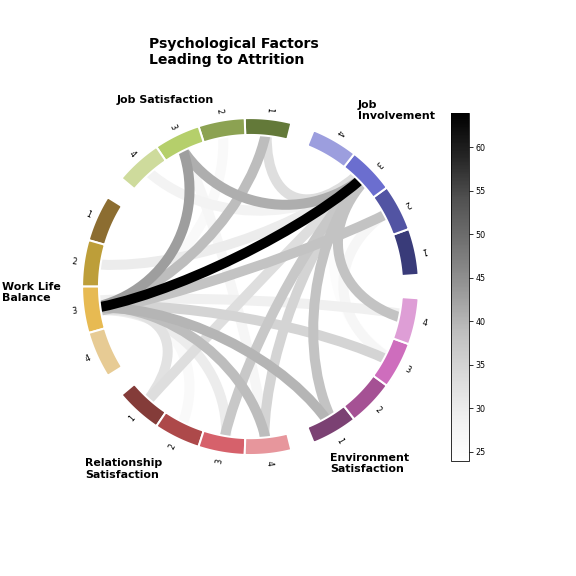
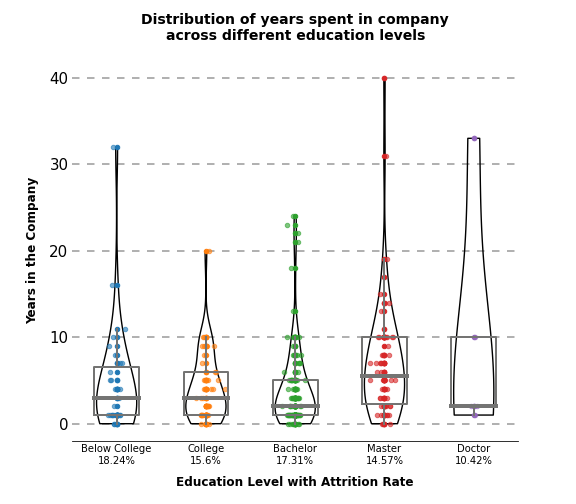

In [ ]:
#https://stackoverflow.com/questions/51576756/display-render-an-html-file-inside-jupyter-notebook-on-google-colab-platform
IPython.display.HTML(filename='/content/gdrive/MyDrive/dashboard.html')